In [ ]:
# Mount Google drive drive to access files stored on it
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Essential libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
import os

In [ ]:
#Loading the file combined_jun_sep.xlsx

path = '/content/combined_jun_sep.xlsx'
df = pd.read_excel(path)
df.head()

,ID,Date,Consent,Selected_Language,StartTime,QuestionsTime,IntroductionTime,SolvingProblemTime,EndingTime,Age,...,Instruction_CloseTime,Reset_Time,Clue_StartTime,Clue_CloseTime,Clue_Index,TimeOutEvent_StartTime,TimeOutEvent_CloseTime,SubmitAnswer_StartTime,SubmitAnswer_CloseTime,SubmitAnswer_CorrectAnswer
0,20230605-0000,2023-06-05,True,0,13:24:19:737,13:24:34:703,13:25:18:496,13:27:20:887,13:28:08:816,47,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,20230605-0000,2023-06-05,True,0,13:24:19:737,13:24:34:703,13:25:18:496,13:27:20:887,13:28:08:816,47,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20230605-0004,2023-06-05,True,0,18:18:02:443,18:18:09:450,18:18:10:819,18:18:13:288,18:18:25:666,84,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,20230605-0003,2023-06-05,True,0,18:15:58:287,18:16:05:444,18:16:06:879,18:17:47:430,18:17:58:289,32,...,18:17:46:361,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,20230605-0003,2023-06-05,True,0,18:15:58:287,18:16:05:444,18:16:06:879,18:17:47:430,18:17:58:289,32,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.columns

Index(['ID', 'Date', 'Consent', 'Selected_Language', 'StartTime',
       'QuestionsTime', 'IntroductionTime', 'SolvingProblemTime', 'EndingTime',
       'Age', 'Gender', 'Companionship', 'EnjoysPuzzles', 'GoodAtPuzzles',
       'FeelInsight', 'FeelStuck', 'WayOfSolvingTheProblem', 'GaveUpReason',
       'Condition', 'MovementDataFilename', 'TerminationType', 'GiveUp',
       'TimeOut', 'ProblemSolved', 'ShowTheSolution', 'Moves_CoinID',
       'Moves_StartTime', 'Moves_CloseTime', 'Moves_BoardID_From',
       'Moves_BoardID_To', 'Moves_targetStatus', 'Instruction_StartTime',
       'Instruction_CloseTime', 'Reset_Time', 'Clue_StartTime',
       'Clue_CloseTime', 'Clue_Index', 'TimeOutEvent_StartTime',
       'TimeOutEvent_CloseTime', 'SubmitAnswer_StartTime',
       'SubmitAnswer_CloseTime', 'SubmitAnswer_CorrectAnswer'],
      dtype='object')

In [ ]:
df.dtypes

,0
ID,object
Date,datetime64[ns]
Consent,bool
Selected_Language,int64
StartTime,object
QuestionsTime,object
IntroductionTime,object
SolvingProblemTime,object
EndingTime,object
Age,int64


In [ ]:
# Keep only rows with actual moves (Moves_CoinID is not null)
df_moves = df[df['Moves_CoinID'].notnull()].copy()

In [ ]:
print(df_moves)

                   ID       Date  Consent  Selected_Language     StartTime  \
1       20230605-0000 2023-06-05     True                  0  13:24:19:737   
6       20230605-0002 2023-06-05     True                  1  18:13:50:911   
7       20230605-0002 2023-06-05     True                  1  18:13:50:911   
8       20230605-0002 2023-06-05     True                  1  18:13:50:911   
15      20230605-0000 2023-06-05     True                  0  13:24:19:737   
...               ...        ...      ...                ...           ...   
262209  20230930-0123 2023-09-30     True                  0  15:38:06:741   
262210  20230930-0123 2023-09-30     True                  0  15:38:06:741   
262211  20230930-0123 2023-09-30     True                  0  15:38:06:741   
262212  20230930-0123 2023-09-30     True                  0  15:38:06:741   
262213  20230930-0123 2023-09-30     True                  0  15:38:06:741   

       QuestionsTime IntroductionTime SolvingProblemTime    End

In [ ]:
# Fix time formatting (change last ":" to ".")
df_moves['Moves_Time_Fixed'] = df_moves['Moves_StartTime'].astype(str).str.replace(r':(\d{3})$', r'.\1', regex=True)

In [ ]:
# Combine with 'Date' column
df_moves['Moves_Timestamp_Str'] = df_moves['Date'].astype(str) + ' ' + df_moves['Moves_Time_Fixed']

In [ ]:
# Parse full datetime
df_moves['Moves_Timestamp'] = pd.to_datetime(df_moves['Moves_Timestamp_Str'], format='%Y-%m-%d %H:%M:%S.%f', errors='coerce')

In [ ]:
# If Moves_CoinID already contains letters like 'A', 'B', ..., 'J', just prefix with "Coin "
df_moves['Coin_Name'] = df_moves['Moves_CoinID'].astype(str).str.strip().apply(lambda x: f"Coin {x}")

In [ ]:
df_moves = df_moves[['ID', 'Moves_Timestamp', 'Coin_Name', 'Moves_BoardID_From', 'Moves_BoardID_To']]
df_moves = df_moves.sort_values(by=['ID', 'Moves_Timestamp']).reset_index(drop=True)

In [ ]:
df_moves['Move_Description'] = df_moves.apply(
    lambda row: f"{row['Coin_Name']} moved from {int(row['Moves_BoardID_From'])} to {int(row['Moves_BoardID_To'])}", axis=1
)

In [ ]:
participant_moves = df_moves.groupby('ID')['Move_Description'].apply(list).reset_index()

In [ ]:
print(participant_moves)

                  ID                                   Move_Description
0      20230605-0000  [Coin D moved from 25 to 51, Coin B moved from...
1      20230605-0002  [Coin J moved from 49 to 13, Coin A moved from...
2      20230606-0000  [Coin J moved from 49 to 4, Coin E moved from ...
3      20230612-0000  [Coin J moved from 49 to 13, Coin I moved from...
4      20230614-0000  [Coin H moved from 39 to 51, Coin A moved from...
...              ...                                                ...
14313  20230930-0180  [Coin J moved from 49 to 4, Coin D moved from ...
14314  20230930-0181  [Coin J moved from 49 to 13, Coin A moved from...
14315  20230930-0182  [Coin D moved from 25 to 51, Coin A moved from...
14316  20230930-0183  [Coin D moved from 25 to 27, Coin C moved from...
14317  20230930-0184  [Coin C moved from 23 to 23, Coin C moved from...

[14318 rows x 2 columns]


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display, clear_output
import ipywidgets as widgets
import re

# --- Initial coin layout ---
initial_positions = {
    "A": 19, "B": 21, "C": 23, "D": 25,
    "E": 29, "F": 31, "G": 33,
    "H": 39, "I": 41,
    "J": 49
}

# --- Helper functions ---
def idx_to_xy(idx):
    return int(idx % 9), int(idx // 9)  # 9 columns (0–8)

def draw_board(ax):
    ax.set_xlim(-0.5, 8.5)
    ax.set_ylim(-0.5, 7.5)
    ax.set_aspect('equal')
    ax.axis('off')
    for i in range(72):  # 9x8 grid
        x, y = idx_to_xy(i)
        ax.add_patch(plt.Rectangle((x - 0.5, y - 0.5), 1, 1, fill=False, edgecolor='lightgray'))
        ax.text(x, y, str(i), ha='center', va='center', fontsize=7, color='gray', alpha=0.7)

# --- Animation function ---
def animate_participant(participant_id):
    moves_raw = participant_moves.loc[participant_moves['ID'] == participant_id, 'Move_Description'].values
    if len(moves_raw) == 0:
        print(f"No moves found for {participant_id}")
        return
    moves_raw = moves_raw[0]

    # Parse moves like "Coin D moved from 25 to 51"
    moves = []
    for m in moves_raw:
        match = re.match(r"Coin (\w) moved from (\d+) to (\d+)", m)
        if match:
            coin, frm, to = match.groups()
            moves.append((coin, int(frm), int(to)))

    if len(moves) == 0:
        print(f"No valid moves for {participant_id}")
        return

    # Create the figure
    fig, ax = plt.subplots(figsize=(8,6))
    draw_board(ax)

    # Initialize all coins
    scatters = {}
    for coin, idx in initial_positions.items():
        x, y = idx_to_xy(idx)
        scat = ax.scatter(x, y, s=400, color='skyblue', edgecolors='black', zorder=3)
        txt = ax.text(x, y, coin, ha='center', va='center', fontsize=14, fontweight='bold', zorder=4)
        scatters[coin] = (scat, txt)

    title = ax.text(0, 8.1, f"Participant {participant_id} — Before moves",
                    fontsize=12, weight='bold', ha='left')

    # Animation logic
    frames_per_move = 20
    total_frames = frames_per_move * len(moves)

    def update(frame):
        move_idx = min(frame // frames_per_move, len(moves)-1)
        coin, frm, to = moves[move_idx]
        frac = (frame % frames_per_move) / frames_per_move
        x1, y1 = idx_to_xy(frm)
        x2, y2 = idx_to_xy(to)
        x = x1 + (x2 - x1) * frac
        y = y1 + (y2 - y1) * frac
        scat, txt = scatters[coin]
        scat.set_offsets([x, y])
        txt.set_position((x, y))
        scat.set_color('limegreen' if to != frm else 'orange')  # moved vs touched but same
        title.set_text(f"Participant {participant_id} — Move {move_idx+1}/{len(moves)}: {coin} {frm}→{to}")
        return [scat, txt, title]

    anim = FuncAnimation(fig, update, frames=total_frames, interval=200, blit=False)
    plt.close(fig)
    display(HTML(anim.to_jshtml()))

# --- Dropdown for all participants ---
participants = sorted(participant_moves['ID'].unique())
dropdown = widgets.Dropdown(options=participants, description='Participant:', layout=widgets.Layout(width='420px'))
display(dropdown)

def on_change(change):
    if change['type'] == 'change' and change['name'] == 'value':
        clear_output(wait=True)
        display(dropdown)
        animate_participant(change['new'])

dropdown.observe(on_change)

# Run for first participant automatically
animate_participant(participants[0])

Dropdown(description='Participant:', layout=Layout(width='420px'), options=('20230605-0000', '20230605-0002', …

In [ ]:
# TASK 1. Step 1. Pattern of movements for the individual data
participant_moves['Movement_Pattern'] = participant_moves['Move_Description'].apply(lambda moves: ' → '.join(moves)) # First five raws of movement parttern
participant_moves = participant_moves[['ID', 'Movement_Pattern']]
participant_moves.head()

,ID,Movement_Pattern
0,20230605-0000,Coin D moved from 25 to 51 → Coin B moved from...
1,20230605-0002,Coin J moved from 49 to 13 → Coin A moved from...
2,20230606-0000,Coin J moved from 49 to 4 → Coin E moved from ...
3,20230612-0000,Coin J moved from 49 to 13 → Coin I moved from...
4,20230614-0000,Coin H moved from 39 to 51 → Coin A moved from...


In [ ]:
print(participant_moves.columns.tolist())


['ID', 'Movement_Pattern']


In [ ]:
#Only the first move per participant
first_moves = df_moves.groupby('ID').first().reset_index()
first_coin_counts = first_moves['Coin_Name'].value_counts()
print(first_coin_counts)

Coin_Name
Coin J    4947
Coin D    3544
Coin A    1929
Coin H     987
Coin F     677
Coin C     588
Coin I     562
Coin B     426
Coin G     393
Coin E     265
Name: count, dtype: int64


/tmp/ipython-input-3774963275.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=first_coin_counts.index, y=first_coin_counts.values, palette="muted")


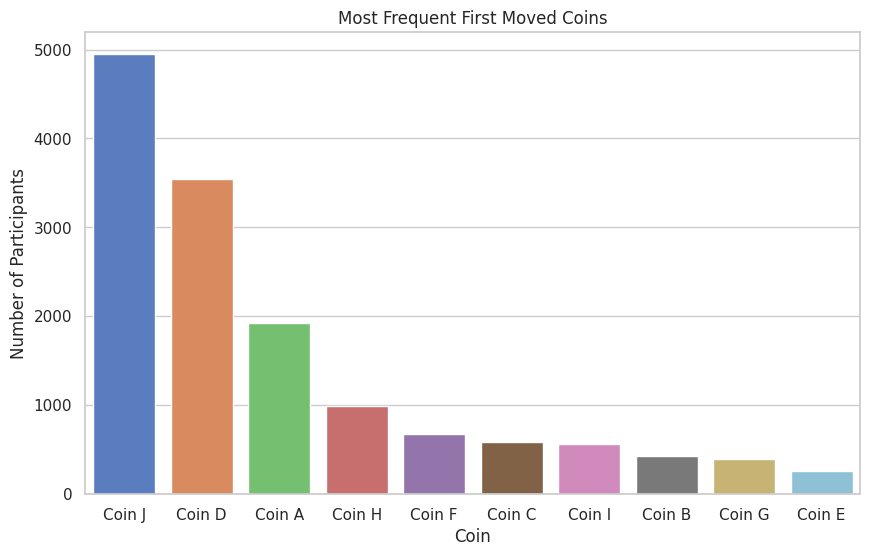

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set a style
sns.set(style="whitegrid")

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=first_coin_counts.index, y=first_coin_counts.values, palette="muted")
plt.title("Most Frequent First Moved Coins")
plt.xlabel("Coin")
plt.ylabel("Number of Participants")
plt.show()

In [ ]:
#Every move by every participant
from collections import Counter

#Break all movement patterns into individual move strings
all_moves = participant_moves['Movement_Pattern'].str.split(' → ').explode()

# Extract coin letters (A to J) from each move
coin_names = all_moves.str.extract(r'Coin (\w)')  # This returns a DataFrame with column 0

# frequencies of each coin (drop any missing values)
coin_counts = coin_names[0].value_counts()

# Step 4 View the result
print(coin_counts)

0
J    40443
D    40046
A    36169
H    15447
I    15443
F    10134
C     9236
G     8669
B     8349
E     7399
Name: count, dtype: int64


/tmp/ipython-input-1145798355.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=coin_counts.index, y=coin_counts.values, palette="muted")


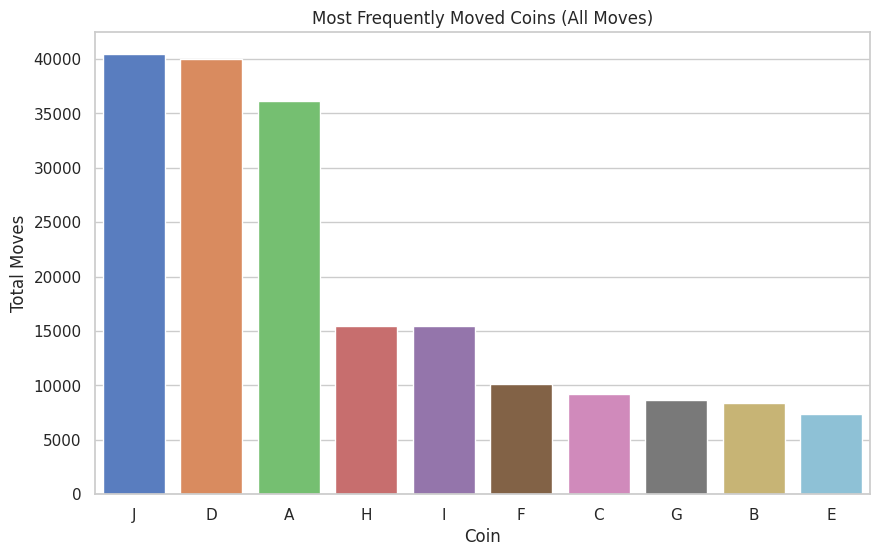

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.barplot(x=coin_counts.index, y=coin_counts.values, palette="muted")
plt.title("Most Frequently Moved Coins (All Moves)")
plt.xlabel("Coin")
plt.ylabel("Total Moves")
plt.show()

In [ ]:
# Count the number of moves per participant (ID)
moves_per_participant = df_moves.groupby('ID').size()

# Find the maximum number of moves made by a participant
max_moves = moves_per_participant.max()

# Find the participant(s) with that max number of moves
max_movers = moves_per_participant[moves_per_participant == max_moves]

print(f"Maximum moves made by any participant: {max_moves}")
print("Participant(s) with max moves:")
print(max_movers)

Maximum moves made by any participant: 252
Participant(s) with max moves:
ID
20230627-0174    252
dtype: int64


In [ ]:
# Count moves per participant
moves_per_participant = df_moves.groupby('ID').size()

# Get descriptive statistics
stats = moves_per_participant.describe()

print(stats)

count    14318.000000
mean        13.363249
std         11.760650
min          1.000000
25%          5.000000
50%         10.000000
75%         18.000000
max        252.000000
dtype: float64


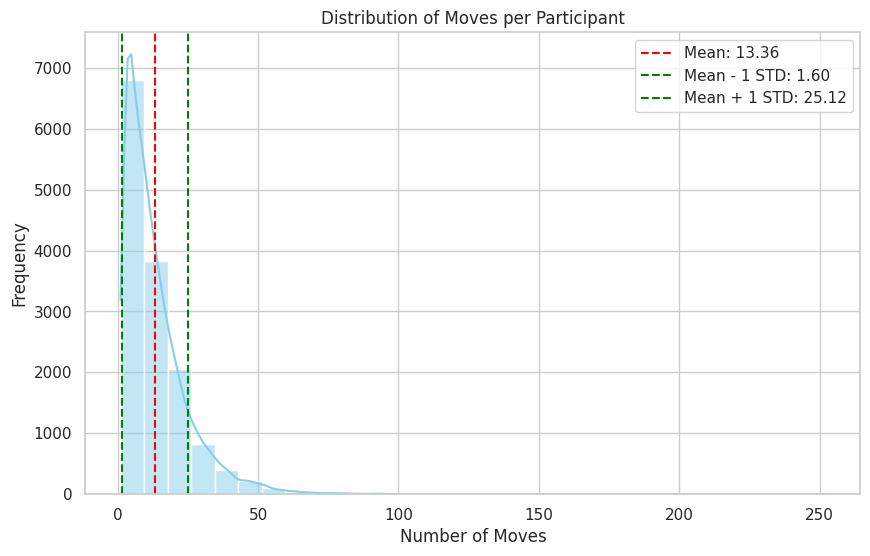

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# moves_per_participant is your Series of move counts per ID
plt.figure(figsize=(10,6))

sns.histplot(moves_per_participant, bins=30, kde=True, color='skyblue')

# Plot mean line
mean_val = moves_per_participant.mean()
plt.axvline(mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.2f}')

# Plot std deviation lines
std_val = moves_per_participant.std()
plt.axvline(mean_val - std_val, color='green', linestyle='--', label=f'Mean - 1 STD: {mean_val - std_val:.2f}')
plt.axvline(mean_val + std_val, color='green', linestyle='--', label=f'Mean + 1 STD: {mean_val + std_val:.2f}')

plt.title('Distribution of Moves per Participant')
plt.xlabel('Number of Moves')
plt.ylabel('Frequency')
plt.legend()
plt.show()


In [ ]:
# Assuming moves_per_participant is a Series with index=ID and values=move counts
min_moves = moves_per_participant.min()

# Find all participants who made the minimum moves
min_move_participants = moves_per_participant[moves_per_participant == min_moves]

print(f"Minimum number of moves made: {min_moves}")
print("Participant IDs with minimum moves:")
print(min_move_participants.index.tolist())

Minimum number of moves made: 1
Participant IDs with minimum moves:
['20230622-0032', '20230623-0008', '20230623-0028', '20230623-0123', '20230623-0138', '20230624-0091', '20230625-0024', '20230625-0041', '20230625-0100', '20230625-0175', '20230626-0003', '20230626-0065', '20230626-0104', '20230626-0124', '20230627-0064', '20230628-0106', '20230629-0021', '20230629-0041', '20230629-0069', '20230630-0139', '20230701-0113', '20230701-0139', '20230702-0144', '20230702-0156', '20230704-0170', '20230705-0019', '20230705-0059', '20230707-0020', '20230707-0043', '20230707-0078', '20230707-0105', '20230708-0010', '20230708-0011', '20230708-0017', '20230708-0025', '20230708-0064', '20230708-0125', '20230708-0135', '20230708-0152', '20230709-0159', '20230709-0171', '20230710-0032', '20230710-0098', '20230711-0018', '20230711-0038', '20230711-0077', '20230711-0092', '20230711-0183', '20230712-0160', '20230712-0168', '20230713-0088', '20230713-0118', '20230713-0185', '20230714-0058', '20230714-010

In [ ]:
print(f"Minimum number of moves made: {min_moves}")
print("Participant IDs with minimum moves:")
for i, pid in enumerate(min_move_participants.index, 1):
    print(f"{i}. {pid}")

Minimum number of moves made: 1
Participant IDs with minimum moves:
1. 20230622-0032
2. 20230623-0008
3. 20230623-0028
4. 20230623-0123
5. 20230623-0138
6. 20230624-0091
7. 20230625-0024
8. 20230625-0041
9. 20230625-0100
10. 20230625-0175
11. 20230626-0003
12. 20230626-0065
13. 20230626-0104
14. 20230626-0124
15. 20230627-0064
16. 20230628-0106
17. 20230629-0021
18. 20230629-0041
19. 20230629-0069
20. 20230630-0139
21. 20230701-0113
22. 20230701-0139
23. 20230702-0144
24. 20230702-0156
25. 20230704-0170
26. 20230705-0019
27. 20230705-0059
28. 20230707-0020
29. 20230707-0043
30. 20230707-0078
31. 20230707-0105
32. 20230708-0010
33. 20230708-0011
34. 20230708-0017
35. 20230708-0025
36. 20230708-0064
37. 20230708-0125
38. 20230708-0135
39. 20230708-0152
40. 20230709-0159
41. 20230709-0171
42. 20230710-0032
43. 20230710-0098
44. 20230711-0018
45. 20230711-0038
46. 20230711-0077
47. 20230711-0092
48. 20230711-0183
49. 20230712-0160
50. 20230712-0168
51. 20230713-0088
52. 20230713-0118
53. 2

In [ ]:
# Split each Movement_Pattern into a list of moves
participant_moves['Move_List'] = participant_moves['Movement_Pattern'].str.split(' → ')

In [ ]:
# Explode the moves while keeping track of their position (step)
exploded_moves = participant_moves.explode('Move_List')
exploded_moves['Step'] = exploded_moves.groupby('ID').cumcount() + 1

In [ ]:
# Top moves per step
top_moves_per_step = exploded_moves.groupby('Step')['Move_List'].value_counts().groupby(level=0).head(5)
print(top_moves_per_step)

Step  Move_List                 
1     Coin J moved from 49 to 13    1940
      Coin J moved from 49 to 49    1778
      Coin D moved from 25 to 25    1553
      Coin A moved from 19 to 19     738
      Coin J moved from 49 to 4      570
                                    ... 
248   Coin H moved from 39 to 11       1
249   Coin F moved from 31 to 20       1
250   Coin J moved from 49 to 21       1
251   Coin I moved from 41 to 22       1
252   Coin G moved from 33 to 23       1
Name: count, Length: 745, dtype: int64


In [ ]:
for step in sorted(exploded_moves['Step'].unique()):
    print(f"\nTop moves at step {step}:")
    top_moves = top_moves_per_step.loc[step]
    print(top_moves)


Top moves at step 1:
Move_List
Coin J moved from 49 to 13    1940
Coin J moved from 49 to 49    1778
Coin D moved from 25 to 25    1553
Coin A moved from 19 to 19     738
Coin J moved from 49 to 4      570
Name: count, dtype: int64

Top moves at step 2:
Move_List
Coin D moved from 25 to 43    769
Coin J moved from 49 to 13    716
Coin A moved from 19 to 37    690
Coin J moved from 49 to 49    464
Coin D moved from 25 to 25    449
Name: count, dtype: int64

Top moves at step 3:
Move_List
Coin J moved from 49 to 13    1102
Coin A moved from 19 to 37     769
Coin D moved from 25 to 43     562
Coin J moved from 49 to 4      443
Coin H moved from 39 to 11     335
Name: count, dtype: int64

Top moves at step 4:
Move_List
Coin J moved from 49 to 13    865
Coin A moved from 19 to 37    328
Coin D moved from 25 to 43    312
Coin J moved from 49 to 4     310
Coin I moved from 41 to 15    213
Name: count, dtype: int64

Top moves at step 5:
Move_List
Coin J moved from 49 to 13    718
Coin D moved

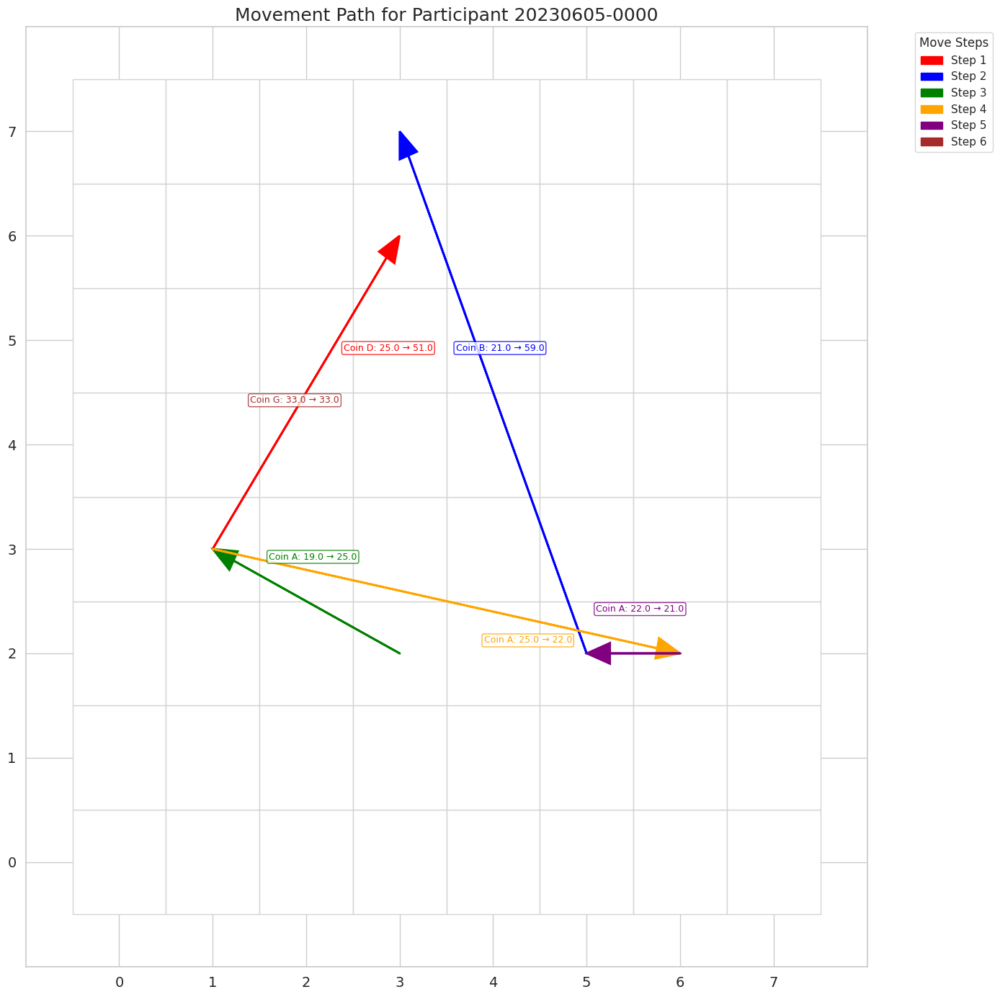

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

def boardid_to_xy(board_id):
    return board_id % 8, board_id // 8

# Select participant
participant_id = '20230605-0000'
participant_data = df_moves[df_moves['ID'] == participant_id].sort_values('Moves_Timestamp').reset_index(drop=True)

# Setup figure
fig, ax = plt.subplots(figsize=(14, 14))
ax.set_xlim(-1, 8)
ax.set_ylim(-1, 8)
ax.set_xticks(range(8))
ax.set_yticks(range(8))
ax.set_xticklabels(range(8), fontsize=14)
ax.set_yticklabels(range(8), fontsize=14)
ax.set_title(f'Movement Path for Participant {participant_id}', fontsize=18)

# Draw grid
for x in range(8):
    for y in range(8):
        ax.add_patch(plt.Rectangle((x - 0.5, y - 0.5), 1, 1, edgecolor='lightgray', facecolor='white'))

# Colors for arrows
colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'cyan', 'olive', 'magenta']
num_moves = len(participant_data)
color_cycle = [colors[i % len(colors)] for i in range(num_moves)]

# Draw arrows and external move labels
for i, row in participant_data.iterrows():
    x_start, y_start = boardid_to_xy(row['Moves_BoardID_From'])
    x_end, y_end = boardid_to_xy(row['Moves_BoardID_To'])
    color = color_cycle[i]

    # Draw arrow
    ax.arrow(x_start, y_start, x_end - x_start, y_end - y_start,
             head_width=0.2, head_length=0.25, fc=color, ec=color, linewidth=2,
             length_includes_head=True)

    # Label move outside the grid (side of arrow)
    mid_x = (x_start + x_end) / 2
    mid_y = (y_start + y_end) / 2
    offset_x = 0.4 if x_end >= x_start else -0.4
    offset_y = 0.4 if y_end >= y_start else -0.4

    ax.text(mid_x + offset_x, mid_y + offset_y,
            f"{row['Coin_Name']}: {row['Moves_BoardID_From']} → {row['Moves_BoardID_To']}",
            fontsize=9, color=color,
            bbox=dict(facecolor='white', edgecolor=color, alpha=0.8, boxstyle='round,pad=0.2'))

# Optional: Add step number legend
handles = [mpatches.Patch(color=colors[i], label=f"Step {i+1}") for i in range(min(num_moves, len(colors)))]
ax.legend(handles=handles, title='Move Steps', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.grid(True)
plt.tight_layout()
plt.show()

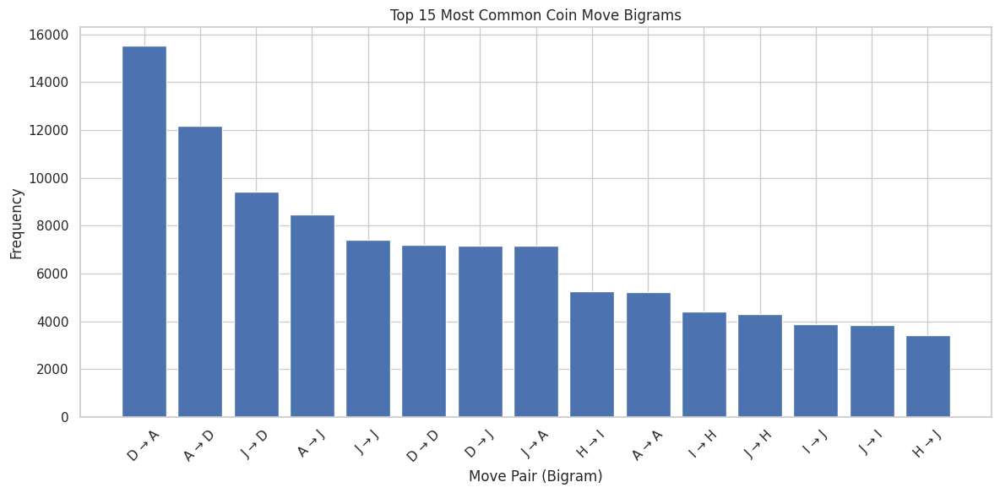

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

# Assuming participant_moves['Movement_Pattern'] is a string like:
# "Coin J moved from 49 to 13 → Coin D moved from 25 to 43 → Coin A moved from 19 to 37"

# Step 1: Split each Movement_Pattern into a list of coins only (e.g., ['J', 'D', 'A'])
def extract_coins(movement_str):
    # Extract coin letters from the moves using regex
    import re
    coins = re.findall(r'Coin (\w)', movement_str)
    return coins

participant_moves['Coins_List'] = participant_moves['Movement_Pattern'].apply(extract_coins)

# Step 2: Extract all bigrams (pairs) from each Coins_List
def bigrams(lst):
    return [(lst[i], lst[i+1]) for i in range(len(lst)-1)]

participant_moves['Coin_Bigrams'] = participant_moves['Coins_List'].apply(bigrams)

# Step 3: Flatten all bigrams from all participants into a single list
all_bigrams = [bigram for sublist in participant_moves['Coin_Bigrams'] for bigram in sublist]

# Step 4: Count frequency of each bigram
bigram_counts = Counter(all_bigrams)

# Step 5: Convert to DataFrame for easier plotting
bigram_df = pd.DataFrame(bigram_counts.items(), columns=['Bigram', 'Count'])
bigram_df = bigram_df.sort_values('Count', ascending=False).head(15)

# Step 6: Visualize top bigrams
plt.figure(figsize=(12,6))
plt.bar(range(len(bigram_df)), bigram_df['Count'], tick_label=[f"{a} → {b}" for a,b in bigram_df['Bigram']])
plt.xticks(rotation=45)
plt.title('Top 15 Most Common Coin Move Bigrams')
plt.xlabel('Move Pair (Bigram)')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

In [ ]:
from collections import Counter

# Assuming participant_moves['Movement_Pattern'] exists

# Step 1: Split movement patterns into lists
participant_moves['Move_List'] = participant_moves['Movement_Pattern'].str.split(' → ')

# Step 2: Extract bigrams (pairs of consecutive moves)
def get_bigrams(moves):
    return [(moves[i], moves[i+1]) for i in range(len(moves)-1)] if len(moves) > 1 else []

participant_moves['Bigrams'] = participant_moves['Move_List'].apply(get_bigrams)

# Step 3: Flatten list of all bigrams
all_bigrams = [bigram for sublist in participant_moves['Bigrams'] for bigram in sublist]

# Step 4: Count frequencies
bigram_freq = Counter(all_bigrams)

# Step 5: Print top 15 bigrams with counts
for bigram, count in bigram_freq.most_common(15):
    print(f"{bigram[0]}  →  {bigram[1]}  :  {count}")

Coin D moved from 25 to 43  →  Coin A moved from 19 to 37  :  3604
Coin J moved from 49 to 13  →  Coin D moved from 25 to 43  :  2558
Coin A moved from 19 to 37  →  Coin D moved from 25 to 43  :  2127
Coin A moved from 19 to 37  →  Coin J moved from 49 to 13  :  1732
Coin J moved from 49 to 13  →  Coin A moved from 19 to 37  :  1483
Coin D moved from 25 to 43  →  Coin J moved from 49 to 13  :  1102
Coin H moved from 39 to 11  →  Coin I moved from 41 to 15  :  933
Coin J moved from 49 to 13  →  Coin D moved from 25 to 42  :  902
Coin D moved from 25 to 42  →  Coin A moved from 19 to 38  :  838
Coin D moved from 25 to 51  →  Coin A moved from 19 to 47  :  832
Coin J moved from 49 to 13  →  Coin A moved from 19 to 38  :  597
Coin J moved from 49 to 49  →  Coin J moved from 49 to 13  :  596
Coin H moved from 39 to 12  →  Coin I moved from 41 to 14  :  560
Coin I moved from 41 to 15  →  Coin H moved from 39 to 11  :  548
Coin A moved from 19 to 38  →  Coin J moved from 49 to 13  :  538


In [ ]:
# Step 1: Split movement patterns into lists
participant_moves['Move_List'] = participant_moves['Movement_Pattern'].str.split(' → ')

# Step 2: Extract triplets (3 consecutive moves)
def get_triplets(moves):
    return [(moves[i], moves[i+1], moves[i+2]) for i in range(len(moves)-2)] if len(moves) > 2 else []

participant_moves['Triplets'] = participant_moves['Move_List'].apply(get_triplets)

# Step 3: Flatten list of all triplets
all_triplets = [triplet for sublist in participant_moves['Triplets'] for triplet in sublist]

# Step 4: Count frequencies
triplet_freq = Counter(all_triplets)

# Step 5: Print top 15 triplets with counts
for triplet, count in triplet_freq.most_common(15):
    print(f"{triplet[0]}  →  {triplet[1]}  →  {triplet[2]}  :  {count}")

Coin J moved from 49 to 13  →  Coin D moved from 25 to 43  →  Coin A moved from 19 to 37  :  2188
Coin D moved from 25 to 43  →  Coin A moved from 19 to 37  →  Coin J moved from 49 to 13  :  1410
Coin J moved from 49 to 13  →  Coin A moved from 19 to 37  →  Coin D moved from 25 to 43  :  1233
Coin A moved from 19 to 37  →  Coin D moved from 25 to 43  →  Coin J moved from 49 to 13  :  796
Coin J moved from 49 to 13  →  Coin D moved from 25 to 42  →  Coin A moved from 19 to 38  :  441
Coin D moved from 25 to 42  →  Coin A moved from 19 to 38  →  Coin J moved from 49 to 13  :  358
Coin J moved from 49 to 13  →  Coin A moved from 19 to 38  →  Coin D moved from 25 to 42  :  297
Coin H moved from 39 to 11  →  Coin I moved from 41 to 15  →  Coin J moved from 49 to 4  :  285
Coin D moved from 25 to 13  →  Coin A moved from 19 to 37  →  Coin J moved from 49 to 43  :  264
Coin A moved from 19 to 37  →  Coin J moved from 49 to 13  →  Coin D moved from 25 to 43  :  261
Coin J moved from 49 to 13  

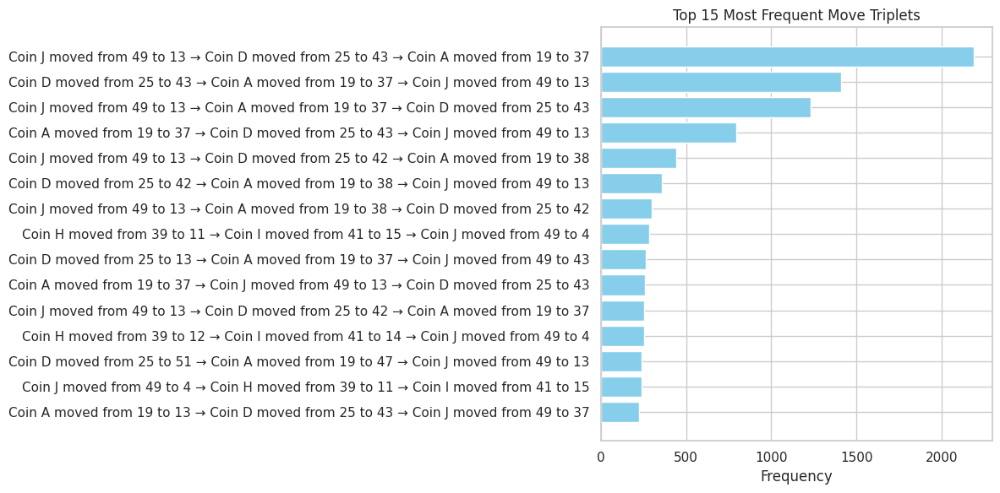

In [ ]:
import matplotlib.pyplot as plt
from collections import Counter

# Assuming you already have 'triplet_freq' Counter from before

# Get top 15 triplets
top_triplets = triplet_freq.most_common(15)

# Prepare data for plotting
triplet_labels = [' → '.join(triplet) for triplet, _ in top_triplets]
counts = [count for _, count in top_triplets]

# Plot
plt.figure(figsize=(12, 6))
plt.barh(triplet_labels[::-1], counts[::-1], color='skyblue')  # reverse for descending order
plt.xlabel('Frequency')
plt.title('Top 15 Most Frequent Move Triplets')
plt.tight_layout()
plt.show()

In [ ]:
# TASK 2 Common patterns in the movement data
# Assuming participant_moves['Movement_Pattern'] holds movement sequences as strings
common_patterns = participant_moves['Movement_Pattern'].value_counts().head(10)
print(common_patterns)#number of times that entire specific sequence occurred

Movement_Pattern
Coin J moved from 49 to 13 → Coin D moved from 25 to 43 → Coin A moved from 19 to 37                                 351
Coin D moved from 25 to 43 → Coin A moved from 19 to 37 → Coin J moved from 49 to 13                                 215
Coin J moved from 49 to 13 → Coin A moved from 19 to 37 → Coin D moved from 25 to 43                                 191
Coin A moved from 19 to 37 → Coin D moved from 25 to 43 → Coin J moved from 49 to 13                                 106
Coin D moved from 25 to 25                                                                                            59
Coin J moved from 49 to 49                                                                                            46
Coin D moved from 25 to 13 → Coin A moved from 19 to 37 → Coin J moved from 49 to 43                                  44
Coin A moved from 19 to 13 → Coin D moved from 25 to 43 → Coin J moved from 49 to 37                                  39
Coin J moved fr

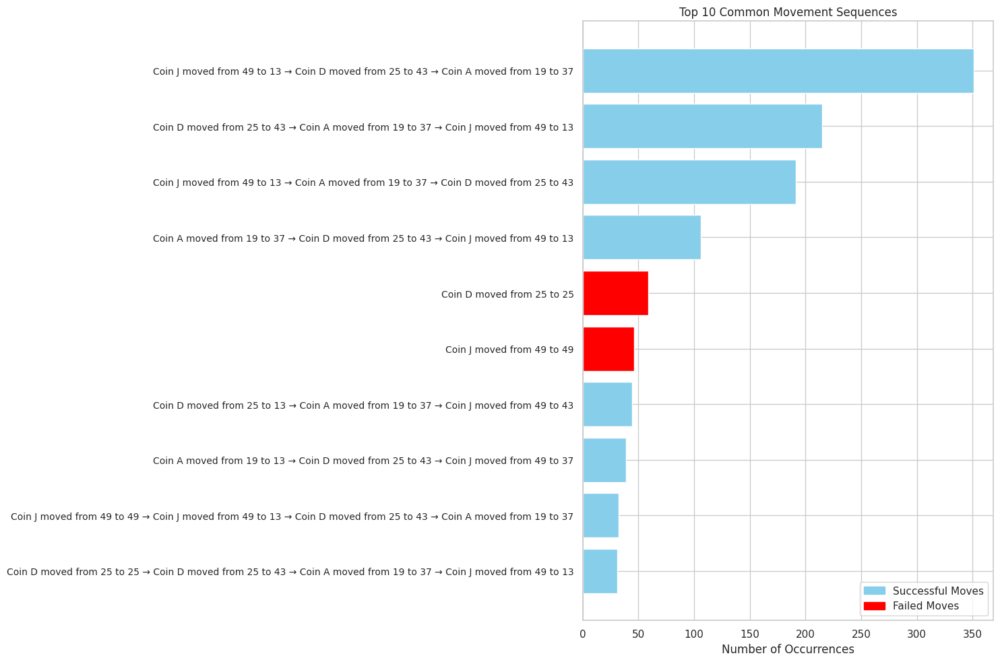

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Use your top 10 movement patterns
common_patterns = participant_moves['Movement_Pattern'].value_counts().head(10)

labels = common_patterns.index.tolist()
counts = common_patterns.values

# These are the only exact failed patterns
failed_patterns = [
    "Coin D moved from 25 to 25",
    "Coin J moved from 49 to 49"
]

# Color only the exact matches in red
bar_colors = ['red' if label.strip() in failed_patterns else 'skyblue' for label in labels]

# Plot horizontal bar chart
plt.figure(figsize=(15, 10))
plt.barh(range(len(counts)), counts, color=bar_colors)
plt.yticks(range(len(counts)), labels, fontsize=10)

plt.xlabel('Number of Occurrences')
plt.title('Top 10 Common Movement Sequences')

plt.gca().invert_yaxis()  # Highest at top
plt.gca().tick_params(axis='y', rotation=0)

# Add legend
legend_elements = [
    mpatches.Patch(color='skyblue', label='Successful Moves'),
    mpatches.Patch(color='red', label='Failed Moves')
]
plt.legend(handles=legend_elements, loc='lower right')

plt.tight_layout()
plt.show()

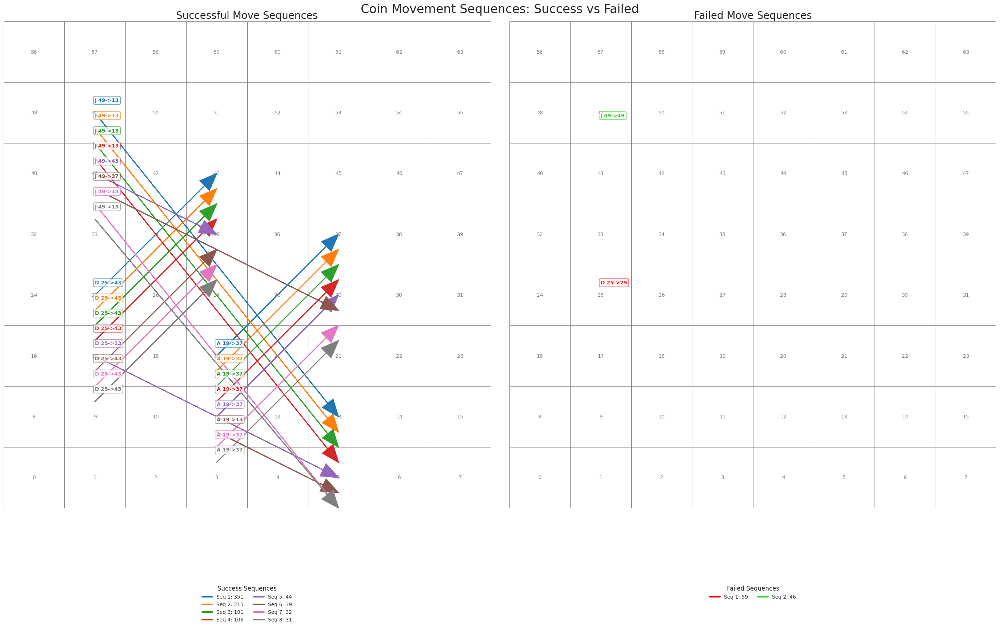

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import numpy as np

# Movement data
movement_counts = {
    "Coin J moved from 49 to 13 → Coin D moved from 25 to 43 → Coin A moved from 19 to 37": 351,
    "Coin D moved from 25 to 43 → Coin A moved from 19 to 37 → Coin J moved from 49 to 13": 215,
    "Coin J moved from 49 to 13 → Coin A moved from 19 to 37 → Coin D moved from 25 to 43": 191,
    "Coin A moved from 19 to 37 → Coin D moved from 25 to 43 → Coin J moved from 49 to 13": 106,
    "Coin D moved from 25 to 25": 59,  # failed
    "Coin J moved from 49 to 49": 46,  # failed
    "Coin D moved from 25 to 13 → Coin A moved from 19 to 37 → Coin J moved from 49 to 43": 44,
    "Coin A moved from 19 to 13 → Coin D moved from 25 to 43 → Coin J moved from 49 to 37": 39,
    "Coin J moved from 49 to 49 → Coin J moved from 49 to 13 → Coin D moved from 25 to 43 → Coin A moved from 19 to 37": 32,
    "Coin D moved from 25 to 25 → Coin D moved from 25 to 43 → Coin A moved from 19 to 37 → Coin J moved from 49 to 13": 31,
}

def is_failed_sequence(seq):
    # A failed sequence has all moves where from == to
    moves = [m.strip() for m in seq.split('→')]
    return all(int(m.split()[4]) == int(m.split()[6]) for m in moves)

def draw_grid(ax):
    # Draw an 8x8 grid
    for idx in range(64):
        x, y = idx % 8, idx // 8
        ax.add_patch(plt.Rectangle((x - 0.5, y - 0.5), 1, 1, fill=False, edgecolor='gray', lw=0.7))
        ax.text(x, y, str(idx), ha='center', va='center', fontsize=10, color='gray')
    ax.set_xlim(-0.5, 7.5)
    ax.set_ylim(-0.5, 7.5)
    ax.set_aspect('equal')
    ax.axis('off')

def plot_sequences(ax, sequences, colors, offset_y=0.25):
    for seq_index, (seq, count) in enumerate(sequences.items()):
        moves = [m.strip() for m in seq.split('→')]
        color = colors[seq_index % len(colors)]

        for move_index, move in enumerate(moves):
            parts = move.split()
            coin = parts[1]
            from_grid = int(parts[4])
            to_grid = int(parts[6])

            x_start = from_grid % 8
            y_start = from_grid // 8
            x_end = to_grid % 8
            y_end = to_grid // 8

            # Apply drop-down (offset) vertically
            y_offset = offset_y * seq_index
            y_start_shifted = y_start - y_offset
            y_end_shifted = y_end - y_offset

            # Clip arrows to stay inside grid
            y_start_shifted = max(-0.5, min(7.5, y_start_shifted))
            y_end_shifted = max(-0.5, min(7.5, y_end_shifted))

            if from_grid != to_grid:
                ax.arrow(x_start, y_start_shifted, x_end - x_start, y_end_shifted - y_start_shifted,
                         head_width=0.22, head_length=0.28,
                         fc=color, ec=color, linewidth=2, length_includes_head=True)

            # Always show move label
            ax.text(x_start, y_start_shifted + 0.18, f"{coin} {from_grid}->{to_grid}",
                    fontsize=10, color=color, fontweight='bold',
                    bbox=dict(facecolor='white', edgecolor=color, alpha=0.7, boxstyle='round,pad=0.3'))

def create_color_palette_success(n):
    cmap = plt.get_cmap('tab10')
    return [cmap(i % 10) for i in range(n)]

def create_color_palette_failed(n):
    # Alternate between red and light green
    return ['red' if i % 2 == 0 else 'limegreen' for i in range(n)]

# Split into success and failed
success_sequences = {seq: cnt for seq, cnt in movement_counts.items() if not is_failed_sequence(seq)}
failed_sequences = {seq: cnt for seq, cnt in movement_counts.items() if is_failed_sequence(seq)}

colors_success = create_color_palette_success(len(success_sequences))
colors_failed = create_color_palette_failed(len(failed_sequences))

# Create figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(28, 16), sharey=True)
draw_grid(ax1)
draw_grid(ax2)

plot_sequences(ax1, success_sequences, colors_success, offset_y=0.25)
ax1.set_title('Successful Move Sequences', fontsize=20)

plot_sequences(ax2, failed_sequences, colors_failed, offset_y=0.25)
ax2.set_title('Failed Move Sequences', fontsize=20)

# Create legends with sequence number and count
legend_success = [
    Line2D([0], [0], color=colors_success[i], lw=3, label=f'Seq {i+1}: {cnt}')
    for i, (_, cnt) in enumerate(success_sequences.items())
]
legend_failed = [
    Line2D([0], [0], color=colors_failed[i], lw=3, label=f'Seq {i+1}: {cnt}')
    for i, (_, cnt) in enumerate(failed_sequences.items())
]

# Position legends
ax1.legend(handles=legend_success, title="Success Sequences", bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=2, fontsize=10, frameon=False)
ax2.legend(handles=legend_failed, title="Failed Sequences", bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=2, fontsize=10, frameon=False)

plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.suptitle("Coin Movement Sequences: Success vs Failed", fontsize=24, y=1.02)

# To save as PDF:
# plt.savefig("final_coin_moves.pdf", bbox_inches='tight')

plt.show()

Dropdown(description='Show:', options=('Both', 'Successful only', 'Failed only'), value='Both')

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


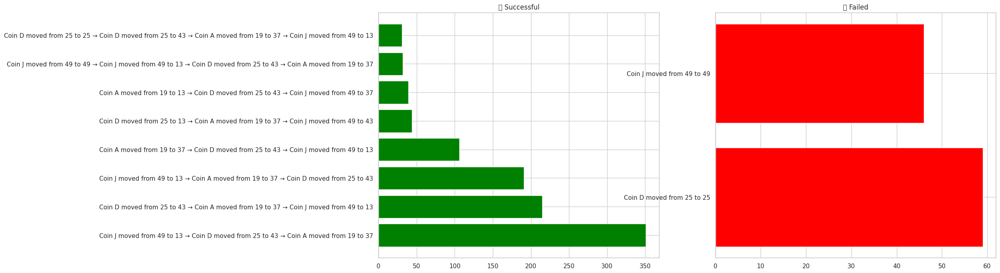

In [ ]:
import ipywidgets as widgets
from IPython.display import display, clear_output

# Dropdown options
options = ["Both", "Successful only", "Failed only"]

dropdown = widgets.Dropdown(options=options, description="Show:")

def update_plot(change):
    clear_output(wait=True)
    display(dropdown)

    choice = change["new"]

    if choice == "Successful only":
        fig, ax = plt.subplots(figsize=(10,6))
        ax.barh(list(success_sequences.keys()), list(success_sequences.values()), color="green")
        ax.set_title("✅ Successful Sequences")
        plt.show()

    elif choice == "Failed only":
        fig, ax = plt.subplots(figsize=(10,6))
        ax.barh(list(failed_sequences.keys()), list(failed_sequences.values()), color="red")
        ax.set_title("❌ Failed Sequences")
        plt.show()

    else:  # Both
        fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,8))
        ax1.barh(list(success_sequences.keys()), list(success_sequences.values()), color="green")
        ax1.set_title("✅ Successful")
        ax2.barh(list(failed_sequences.keys()), list(failed_sequences.values()), color="red")
        ax2.set_title("❌ Failed")
        plt.show()

# Attach function
dropdown.observe(update_plot, names="value")

# Show dropdown first
display(dropdown)
update_plot({"new": "Both"})

In [ ]:

# Step 1: Extract last 3 moves from each sequence

participant_moves['Last3_Moves'] = participant_moves['Movement_Pattern'].apply(
    lambda x: ' → '.join(x.strip().split('→')[-3:])
)

# Add 'Successful' column based on the definition of a failed sequence
# Assuming a sequence is 'Successful' if it's NOT a 'Failed' sequence as defined by is_failed_sequence
participant_moves['Successful'] = participant_moves['Movement_Pattern'].apply(
    lambda x: not is_failed_sequence(x)
)


# Step 2: Separate successful vs unsuccessful

# Assuming you have a column 'Successful' (True/False) or similar
successful_moves = participant_moves[participant_moves['Successful'] == True]
unsuccessful_moves = participant_moves[participant_moves['Successful'] == False]

# Step 3: Count last-3-move sequences
# -----------------------------
last3_successful_counts = successful_moves['Last3_Moves'].value_counts()
last3_unsuccessful_counts = unsuccessful_moves['Last3_Moves'].value_counts()

print("Last 3 moves - Successful:")
print(last3_successful_counts)

print("\nLast 3 moves - Unsuccessful:")
print(last3_unsuccessful_counts)

Last 3 moves - Successful:
Last3_Moves
 Coin J moved from 49 to 13  →  Coin D moved from 25 to 43  →  Coin A moved from 19 to 37    1469
 Coin D moved from 25 to 43  →  Coin A moved from 19 to 37  →  Coin J moved from 49 to 13     979
 Coin J moved from 49 to 13  →  Coin A moved from 19 to 37  →  Coin D moved from 25 to 43     868
 Coin A moved from 19 to 37  →  Coin D moved from 25 to 43  →  Coin J moved from 49 to 13     559
Coin J moved from 49 to 13  →  Coin D moved from 25 to 43  →  Coin A moved from 19 to 37      351
                                                                                             ... 
 Coin J moved from 49 to 32  →  Coin D moved from 25 to 30  →  Coin A moved from 19 to 22       1
 Coin G moved from 33 to 32  →  Coin D moved from 25 to 5  →  Coin A moved from 19 to 3         1
 Coin D moved from 41 to 41  →  Coin B moved from 50 to 50  →  Coin J moved from 49 to 49       1
 Coin A moved from 19 to 19  →  Coin J moved from 49 to 4  →  Coin A moved from

In [ ]:
def is_failed_sequence(seq):
    moves = [m.strip() for m in seq.split('→')]
    for m in moves:
        parts = m.split()
        # Check structure: must have at least 7 parts
        if len(parts) < 7:
            return False  # treat as success if malformed
        try:
            from_grid = int(parts[4])
            to_grid = int(parts[6])
        except ValueError:
            return False  # if parsing fails, treat as success
        if from_grid != to_grid:
            return False
    return True  # only failed if ALL moves are same "from" and "to"

Dropdown(description='Show:', options=('Both', 'Successful only', 'Failed only'), value='Both')

/tmp/ipython-input-2918136654.py:39: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-2918136654.py:39: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


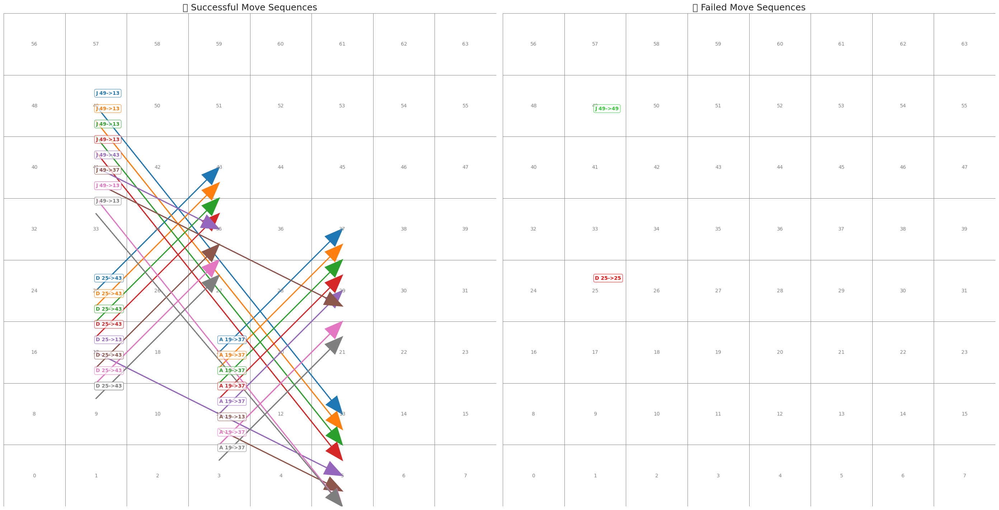

In [ ]:
import ipywidgets as widgets
from IPython.display import display, clear_output

# Dropdown options
options = ["Both", "Successful only", "Failed only"]
dropdown = widgets.Dropdown(options=options, description="Show:")

def update_plot(change):
    clear_output(wait=True)
    display(dropdown)

    choice = change["new"]

    if choice == "Successful only":
        fig, ax = plt.subplots(figsize=(14, 12))
        draw_grid(ax)
        plot_sequences(ax, success_sequences, colors_success, offset_y=0.25)
        ax.set_title("✅ Successful Move Sequences", fontsize=18)
        plt.show()

    elif choice == "Failed only":
        fig, ax = plt.subplots(figsize=(14, 12))
        draw_grid(ax)
        plot_sequences(ax, failed_sequences, colors_failed, offset_y=0.25)
        ax.set_title("❌ Failed Move Sequences", fontsize=18)
        plt.show()

    else:  # Both
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(28, 16), sharey=True)
        draw_grid(ax1)
        draw_grid(ax2)

        plot_sequences(ax1, success_sequences, colors_success, offset_y=0.25)
        ax1.set_title("✅ Successful Move Sequences", fontsize=18)

        plot_sequences(ax2, failed_sequences, colors_failed, offset_y=0.25)
        ax2.set_title("❌ Failed Move Sequences", fontsize=18)

        plt.tight_layout()
        plt.show()

# Attach function
dropdown.observe(update_plot, names="value")

# Show dropdown first
display(dropdown)
update_plot({"new": "Both"})

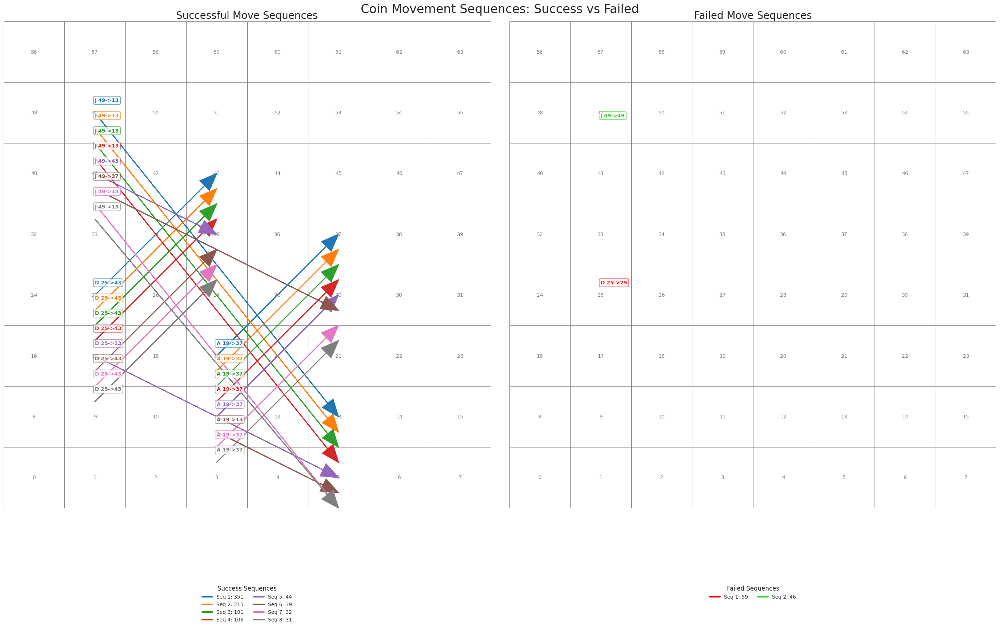

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import numpy as np

# Movement data
movement_counts = {
    "Coin J moved from 49 to 13 → Coin D moved from 25 to 43 → Coin A moved from 19 to 37": 351,
    "Coin D moved from 25 to 43 → Coin A moved from 19 to 37 → Coin J moved from 49 to 13": 215,
    "Coin J moved from 49 to 13 → Coin A moved from 19 to 37 → Coin D moved from 25 to 43": 191,
    "Coin A moved from 19 to 37 → Coin D moved from 25 to 43 → Coin J moved from 49 to 13": 106,
    "Coin D moved from 25 to 25": 59,  # failed
    "Coin J moved from 49 to 49": 46,  # failed
    "Coin D moved from 25 to 13 → Coin A moved from 19 to 37 → Coin J moved from 49 to 43": 44,
    "Coin A moved from 19 to 13 → Coin D moved from 25 to 43 → Coin J moved from 49 to 37": 39,
    "Coin J moved from 49 to 49 → Coin J moved from 49 to 13 → Coin D moved from 25 to 43 → Coin A moved from 19 to 37": 32,
    "Coin D moved from 25 to 25 → Coin D moved from 25 to 43 → Coin A moved from 19 to 37 → Coin J moved from 49 to 13": 31,
}

def is_failed_sequence(seq):
    # A failed sequence has all moves where from == to
    moves = [m.strip() for m in seq.split('→')]
    return all(int(m.split()[4]) == int(m.split()[6]) for m in moves)

def draw_grid(ax):
    # Draw an 8x8 grid
    for idx in range(64):
        x, y = idx % 8, idx // 8
        ax.add_patch(plt.Rectangle((x - 0.5, y - 0.5), 1, 1, fill=False, edgecolor='gray', lw=0.7))
        ax.text(x, y, str(idx), ha='center', va='center', fontsize=10, color='gray')
    ax.set_xlim(-0.5, 7.5)
    ax.set_ylim(-0.5, 7.5)
    ax.set_aspect('equal')
    ax.axis('off')

def plot_sequences(ax, sequences, colors, offset_y=0.25):
    for seq_index, (seq, count) in enumerate(sequences.items()):
        moves = [m.strip() for m in seq.split('→')]
        color = colors[seq_index % len(colors)]

        for move_index, move in enumerate(moves):
            parts = move.split()
            coin = parts[1]
            from_grid = int(parts[4])
            to_grid = int(parts[6])

            x_start = from_grid % 8
            y_start = from_grid // 8
            x_end = to_grid % 8
            y_end = to_grid // 8

            # Apply drop-down (offset) vertically
            y_offset = offset_y * seq_index
            y_start_shifted = y_start - y_offset
            y_end_shifted = y_end - y_offset

            # Clip arrows to stay inside grid
            y_start_shifted = max(-0.5, min(7.5, y_start_shifted))
            y_end_shifted = max(-0.5, min(7.5, y_end_shifted))

            if from_grid != to_grid:
                ax.arrow(x_start, y_start_shifted, x_end - x_start, y_end_shifted - y_start_shifted,
                         head_width=0.22, head_length=0.28,
                         fc=color, ec=color, linewidth=2, length_includes_head=True)

            # Always show move label
            ax.text(x_start, y_start_shifted + 0.18, f"{coin} {from_grid}->{to_grid}",
                    fontsize=10, color=color, fontweight='bold',
                    bbox=dict(facecolor='white', edgecolor=color, alpha=0.7, boxstyle='round,pad=0.3'))

def create_color_palette_success(n):
    cmap = plt.get_cmap('tab10')
    return [cmap(i % 10) for i in range(n)]

def create_color_palette_failed(n):
    # Alternate between red and light green
    return ['red' if i % 2 == 0 else 'limegreen' for i in range(n)]

# Split into success and failed
success_sequences = {seq: cnt for seq, cnt in movement_counts.items() if not is_failed_sequence(seq)}
failed_sequences = {seq: cnt for seq, cnt in movement_counts.items() if is_failed_sequence(seq)}

colors_success = create_color_palette_success(len(success_sequences))
colors_failed = create_color_palette_failed(len(failed_sequences))

# Create figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(28, 16), sharey=True)
draw_grid(ax1)
draw_grid(ax2)

plot_sequences(ax1, success_sequences, colors_success, offset_y=0.25)
ax1.set_title('Successful Move Sequences', fontsize=20)

plot_sequences(ax2, failed_sequences, colors_failed, offset_y=0.25)
ax2.set_title('Failed Move Sequences', fontsize=20)

# Create legends with sequence number and count
legend_success = [
    Line2D([0], [0], color=colors_success[i], lw=3, label=f'Seq {i+1}: {cnt}')
    for i, (_, cnt) in enumerate(success_sequences.items())
]
legend_failed = [
    Line2D([0], [0], color=colors_failed[i], lw=3, label=f'Seq {i+1}: {cnt}')
    for i, (_, cnt) in enumerate(failed_sequences.items())
]

# Position legends
ax1.legend(handles=legend_success, title="Success Sequences", bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=2, fontsize=10, frameon=False)
ax2.legend(handles=legend_failed, title="Failed Sequences", bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=2, fontsize=10, frameon=False)

plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.suptitle("Coin Movement Sequences: Success vs Failed", fontsize=24, y=1.02)

# To save as PDF:
# plt.savefig("final_coin_moves.pdf", bbox_inches='tight')

plt.show()

Dropdown(description='Participant:', options=('20230605-0000', '20230605-0002', '20230606-0000', '20230612-000…

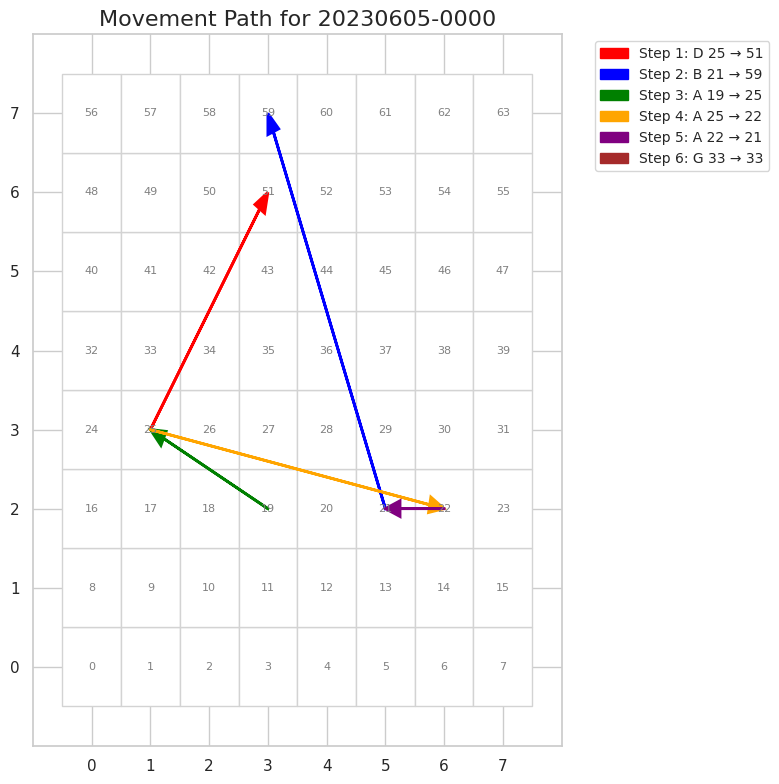

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import ipywidgets as widgets
from IPython.display import display

# Participant dropdown
participant_ids = participant_moves['ID'].tolist()
participant_dropdown = widgets.Dropdown(
    options=participant_ids,
    description='Participant:',
    value=participant_ids[0]
)

# Convert board ID to (x,y)
def boardid_to_xy(board_id):
    return board_id % 8, board_id // 8

# Plot participant moves
def plot_participant_moves(participant_id):
    moves_data = participant_moves[participant_moves['ID'] == participant_id]['Move_List'].values[0]

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xlim(-1, 8)
    ax.set_ylim(-1, 8)
    ax.set_xticks(range(8))
    ax.set_yticks(range(8))
    ax.set_title(f'Movement Path for {participant_id}', fontsize=16)

    # Draw grid and numbers
    for idx in range(64):
        x, y = idx % 8, idx // 8
        ax.add_patch(plt.Rectangle((x - 0.5, y - 0.5), 1, 1, edgecolor='lightgray', facecolor='white'))
        ax.text(x, y, str(idx), ha='center', va='center', fontsize=8, color='gray')

    # Colors for arrows
    colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'cyan', 'olive', 'magenta']

    legend_patches = []

    # Draw arrows and collect legend info
    for i, move in enumerate(moves_data):
        coin = move.split()[1]
        from_board = int(move.split()[4])
        to_board = int(move.split()[6])
        color = colors[i % len(colors)]

        x_start, y_start = boardid_to_xy(from_board)
        x_end, y_end = boardid_to_xy(to_board)

        # Draw arrow
        ax.arrow(x_start, y_start, x_end - x_start, y_end - y_start,
                 head_width=0.2, head_length=0.25, fc=color, ec=color, linewidth=2,
                 length_includes_head=True)

        # Add label **outside** the plot for the step
        legend_patches.append(mpatches.Patch(color=color, label=f"Step {i+1}: {coin} {from_board} → {to_board}"))

    # Place the legend outside the plot
    ax.legend(handles=legend_patches, loc='upper left', bbox_to_anchor=(1.05, 1), fontsize=10)

    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Update function for dropdown
def update_plot(change):
    plot_participant_moves(change['new'])

# Attach dropdown
participant_dropdown.observe(update_plot, names='value')

# Display dropdown and initial plot
display(participant_dropdown)
plot_participant_moves(participant_dropdown.value)

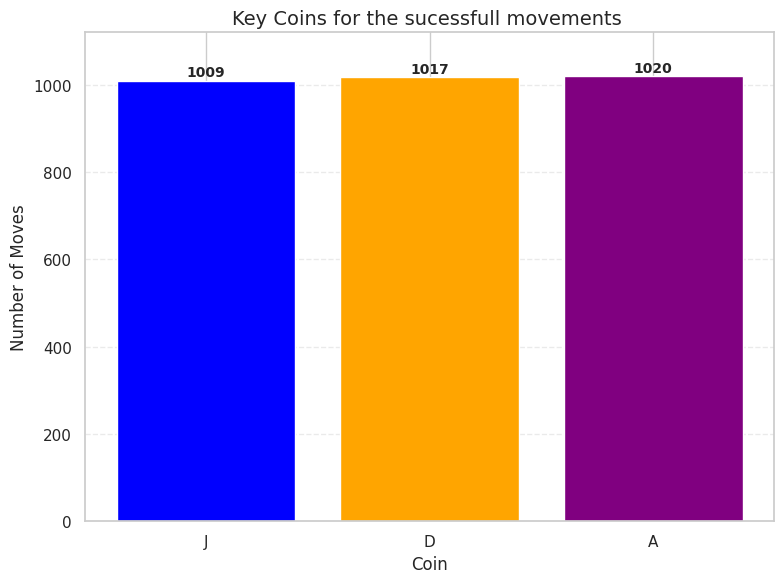

In [ ]:
# TASK 5 Key "coin" which makes the difference
import matplotlib.pyplot as plt

# KEY COINS
coin_success_counts = {
    'J': 1009,
    'D': 1017,
    'A': 1020,
}

# Assign colors to each coin
colors = ['blue', 'orange', 'purple']

# Create the plot
plt.figure(figsize=(8, 6))
bars = plt.bar(coin_success_counts.keys(), coin_success_counts.values(), color=colors)

# Add count labels on each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 10, f'{height}',
             ha='center', fontsize=10, fontweight='bold')

# Add labels and layout
plt.title("Key Coins for the sucessfull movements ", fontsize=14)
plt.xlabel("Coin")
plt.ylabel("Number of Moves")
plt.ylim(0, max(coin_success_counts.values()) + 100)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()

# Show plot
plt.show()

/tmp/ipython-input-1911321747.py:49: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


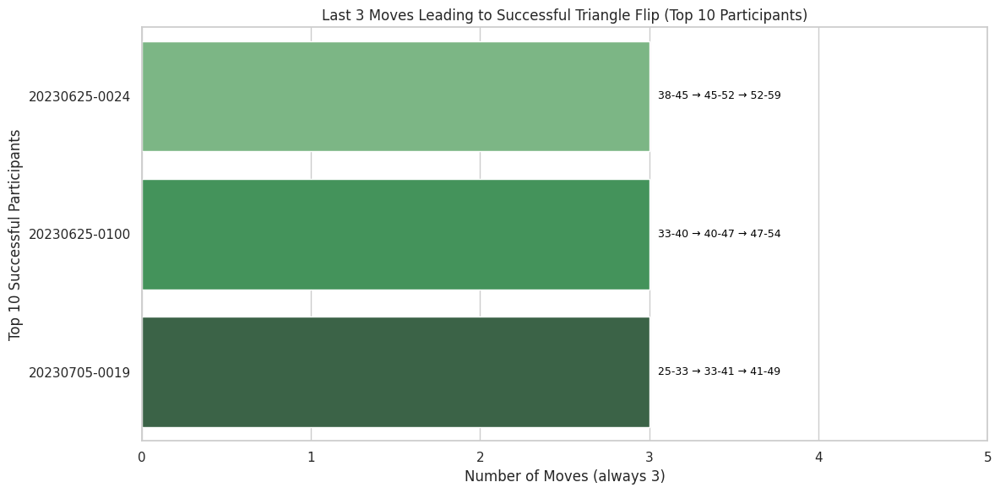

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ===============================
# 1️⃣  Example Dataset (replace with your actual data)
# ===============================
df = pd.DataFrame({
    'ID': ["20230625-0024"]*8 + ["20230625-0100"]*7 + ["20230705-0019"]*6,
    'Moves_CoinID': list("ABCDEFGH") + list("ABCDEFG") + list("ABCDEF"),
    'Moves_BoardID_From': [3,10,17,24,31,38,45,52, 5,12,19,26,33,40,47, 1,9,17,25,33,41],
    'Moves_BoardID_To':   [10,17,24,31,38,45,52,59, 12,19,26,33,40,47,54, 9,17,25,33,41,49],
    'Moves_StartTime': pd.date_range("2023-06-25", periods=21, freq="s").astype(str),
    'ProblemSolved': [True]*21
})

# ===============================
# 2️⃣  Extract successful participants and their last 3 moves
# ===============================
successful_ids = df[df["ProblemSolved"] == True]["ID"].unique().tolist()

last3_data = []
for pid in successful_ids:
    sub = df[df["ID"] == pid].copy()
    sub["Moves_StartTime"] = pd.to_datetime(sub["Moves_StartTime"], errors="coerce")
    sub = sub.sort_values("Moves_StartTime")
    # Take the last 3 moves
    sub_last3 = sub.tail(3)
    if len(sub_last3) == 3:
        move_pattern = " → ".join(
            [f"{r.Moves_BoardID_From}-{r.Moves_BoardID_To}" for _, r in sub_last3.iterrows()]
        )
        last3_data.append({
            "Participant": pid,
            "Last3_Moves": move_pattern
        })

last3_df = pd.DataFrame(last3_data)

# ===============================
# 3️⃣  Aggregate and rank top 10 participants
# ===============================
top10 = last3_df.head(10)  # or choose by specific ranking logic if needed

# ===============================
# 4️⃣  Plotting: horizontal bar chart
# ===============================
plt.figure(figsize=(12, 6))
sns.barplot(
    y='Participant',
    x=[3]*len(top10),  # always 3 moves
    data=top10,
    hue=None,
    palette='Greens_d'
)

# Annotate the last 3 moves pattern text on bars
for i, row in enumerate(top10.itertuples()):
    plt.text(3.05, i, row.Last3_Moves, va='center', ha='left', fontsize=9, color='black')

plt.xlabel('Number of Moves (always 3)')
plt.ylabel('Top 10 Successful Participants')
plt.title('Last 3 Moves Leading to Successful Triangle Flip (Top 10 Participants)')
plt.xlim(0, 5)
plt.tight_layout()
plt.show()


Top participants and their last 3 moves (Move1 = earliest of last3):


/tmp/ipython-input-697365952.py:16: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  'Moves_StartTime': pd.date_range("2023-06-25", periods=26, freq="T").astype(str),


MoveNum,Move1,Move2,Move3
Participant,,,
20230625-0024,F: 38 → 45,G: 45 → 52,H: 52 → 59
20230625-0100,E: 33 → 40,F: 40 → 47,G: 47 → 54
20230705-0019,D: 25 → 33,E: 33 → 41,F: 41 → 49
20230706-0001,C: 20 → 29,D: 29 → 38,E: 38 → 47


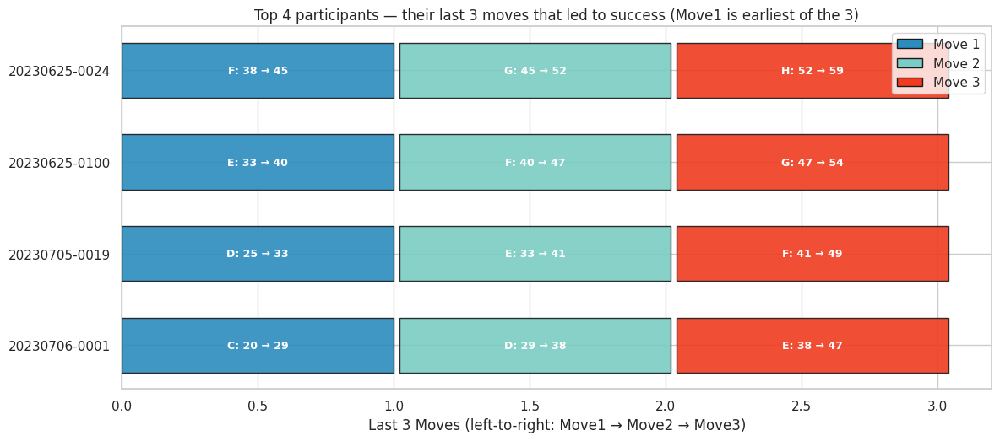

In [ ]:
# Colab-ready: plot top-10 participants' last 3 moves with clear per-move annotations
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import textwrap

# -----------------------
# Replace this df with your real dataset
# required columns: ID, Moves_CoinID, Moves_BoardID_From, Moves_BoardID_To, Moves_StartTime, ProblemSolved
# -----------------------
df = pd.DataFrame({
    'ID': ["20230625-0024"]*8 + ["20230625-0100"]*7 + ["20230705-0019"]*6 + ["20230706-0001"]*5,
    'Moves_CoinID': list("ABCDEFGH") + list("ABCDEFG") + list("ABCDEF") + list("ABCDE"),
    'Moves_BoardID_From': [3,10,17,24,31,38,45,52, 5,12,19,26,33,40,47, 1,9,17,25,33,41, 2,11,20,29,38],
    'Moves_BoardID_To':   [10,17,24,31,38,45,52,59, 12,19,26,33,40,47,54, 9,17,25,33,41,49, 11,20,29,38,47],
    'Moves_StartTime': pd.date_range("2023-06-25", periods=26, freq="T").astype(str),
    'ProblemSolved': [True]*26
})

# -----------------------
# Parameters
# -----------------------
TOP_N = 10   # show top N participants
MIN_MOVES_REQUIRED = 3  # only include participants with at least this many successful moves

# -----------------------
# Preprocessing: only successful trials
# -----------------------
df = df.copy()
df['Moves_StartTime'] = pd.to_datetime(df['Moves_StartTime'], errors='coerce')
successful_df = df[df['ProblemSolved'] == True].copy()

# Group by participant and keep only those with >= MIN_MOVES_REQUIRED moves
grouped = successful_df.groupby('ID')
valid_participants = []
for pid, g in grouped:
    if len(g) >= MIN_MOVES_REQUIRED:
        # get last move time for ordering
        last_time = g['Moves_StartTime'].max()
        valid_participants.append((pid, last_time))

# Sort participants by most recent last move (descending)
valid_participants = sorted(valid_participants, key=lambda x: x[1], reverse=True)
valid_ids = [pid for pid, _ in valid_participants]

# Choose top N participants that have at least 3 moves
top_ids = []
for pid in valid_ids:
    moves_count = len(successful_df[successful_df['ID'] == pid])
    if moves_count >= MIN_MOVES_REQUIRED:
        top_ids.append(pid)
    if len(top_ids) >= TOP_N:
        break

if len(top_ids) == 0:
    raise RuntimeError("No participants with >= 3 successful moves found. Check your df or MIN_MOVES_REQUIRED.")

# -----------------------
# Build a DataFrame with last 3 moves for each top participant
# -----------------------
rows = []
for pid in top_ids:
    sub = successful_df[successful_df['ID'] == pid].sort_values('Moves_StartTime')
    last3 = sub.tail(3).reset_index(drop=True)  # chronological order (oldest -> newest)
    # ensure it has exactly 3
    if len(last3) < 3:
        continue
    for i, r in last3.iterrows():
        move_num = i + 1  # 1..3 (1 = earliest of the last three)
        coin = r['Moves_CoinID']
        frm = r['Moves_BoardID_From'] if pd.notna(r['Moves_BoardID_From']) else None
        to  = r['Moves_BoardID_To']   if pd.notna(r['Moves_BoardID_To']) else None
        move_str = f"{coin}: {int(frm) if frm is not None else 'NA'} → {int(to) if to is not None else 'NA'}"
        rows.append({
            'Participant': pid,
            'MoveNum': move_num,
            'Coin': coin,
            'From': frm,
            'To': to,
            'MoveStr': move_str
        })

last3_df = pd.DataFrame(rows)
# Pivot into wide form for quick inspection (participants as rows, move1..move3 as columns)
pivot_df = last3_df.pivot(index='Participant', columns='MoveNum', values='MoveStr')
pivot_df = pivot_df.rename(columns={1:'Move1', 2:'Move2', 3:'Move3'})
print("Top participants and their last 3 moves (Move1 = earliest of last3):")
display(pivot_df)

# -----------------------
# Plot: horizontal stacked segments — one row per participant, 3 segments per row
# -----------------------
participants = pivot_df.index.tolist()
n = len(participants)
fig_h = 0.9 * max(6, n*0.5)
fig, ax = plt.subplots(figsize=(12, fig_h))

# Colors for move positions
colors = ['#2b8cbe', '#7bccc4', '#f03b20']  # distinct colors for Move1, Move2, Move3
bar_height = 0.6

# We'll position each participant at y = range(n) (top to bottom)
y_positions = np.arange(n)[::-1]  # so first participant is top

for idx, pid in enumerate(participants):
    y = y_positions[idx]
    # for stacked layout each move uses width 1 (just symbolic), we annotate with move strings
    left = 0.0
    for move_num in [1,2,3]:
        txt = pivot_df.loc[pid, f"Move{move_num}"]
        # draw rectangle segment
        ax.barh(y, width=1.0, height=bar_height, left=left, color=colors[move_num-1], edgecolor='k', alpha=0.9)
        # annotate inside segment — wrap text if too long
        wrapped = textwrap.fill(txt, width=18)
        ax.text(left + 0.5, y, wrapped, va='center', ha='center', fontsize=9, color='white', fontweight='bold')
        left += 1.02  # small gap between segments

# Decorations
ax.set_yticks(y_positions)
ax.set_yticklabels(participants)
ax.set_xlabel('Last 3 Moves (left-to-right: Move1 → Move2 → Move3)')
ax.set_xlim(0, 3.2)
ax.set_title(f"Top {len(participants)} participants — their last 3 moves that led to success (Move1 is earliest of the 3)")
# Legend
from matplotlib.patches import Patch
leg = [Patch(facecolor=colors[i], edgecolor='k', label=f"Move {i+1}") for i in range(3)]
ax.legend(handles=leg, loc='upper right')

plt.tight_layout()
plt.show()


Top participants with last 3 unsuccessful moves:


/tmp/ipython-input-860615551.py:18: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  'Moves_StartTime': pd.date_range("2023-06-25", periods=26, freq="T").astype(str),


MoveNum,Move1,Move2,Move3
Participant,,,
20230625-0024,D: 24 → 31,F: 38 → 45,G: 45 → 52
20230625-0100,B: 12 → 19,D: 26 → 33,F: 40 → 47
20230705-0019,C: 17 → 25,D: 25 → 33,F: 41 → 49
20230706-0001,B: 11 → 20,D: 29 → 38,E: 38 → 47


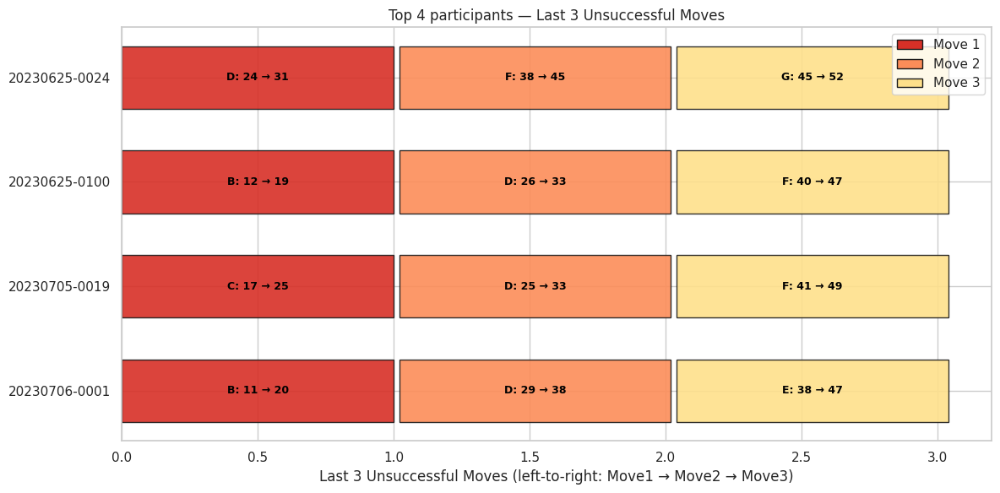

In [ ]:
# Colab-ready: plot top-10 participants' last 3 unsuccessful moves with per-move annotations
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import textwrap
from matplotlib.patches import Patch

# -----------------------
# Example dataset
# Replace this df with your real dataset
# Required columns: ID, Moves_CoinID, Moves_BoardID_From, Moves_BoardID_To, Moves_StartTime, ProblemSolved
# -----------------------
df = pd.DataFrame({
    'ID': ["20230625-0024"]*8 + ["20230625-0100"]*7 + ["20230705-0019"]*6 + ["20230706-0001"]*5,
    'Moves_CoinID': list("ABCDEFGH") + list("ABCDEFG") + list("ABCDEF") + list("ABCDE"),
    'Moves_BoardID_From': [3,10,17,24,31,38,45,52, 5,12,19,26,33,40,47, 1,9,17,25,33,41, 2,11,20,29,38],
    'Moves_BoardID_To':   [10,17,24,31,38,45,52,59, 12,19,26,33,40,47,54, 9,17,25,33,41,49, 11,20,29,38,47],
    'Moves_StartTime': pd.date_range("2023-06-25", periods=26, freq="T").astype(str),
    'ProblemSolved': [True, True, False, False, True, False, False, True, True, False, True, False, True, False,
                      True, False, True, False, False, True, False, True, False, True, False, False]
})

# -----------------------
# Parameters
# -----------------------
TOP_N = 10   # Show top N participants
MIN_MOVES_REQUIRED = 3  # Only include participants with at least this many unsuccessful moves

# -----------------------
# Filter unsuccessful moves
# -----------------------
unsuccessful_df = df[df['ProblemSolved'] == False].copy()
unsuccessful_df['Moves_StartTime'] = pd.to_datetime(unsuccessful_df['Moves_StartTime'], errors='coerce')

# -----------------------
# Identify top N participants by most recent last unsuccessful move
# -----------------------
grouped = unsuccessful_df.groupby('ID')
valid_participants = []
for pid, g in grouped:
    if len(g) >= MIN_MOVES_REQUIRED:
        last_time = g['Moves_StartTime'].max()
        valid_participants.append((pid, last_time))

# Sort by most recent last unsuccessful move
valid_participants = sorted(valid_participants, key=lambda x: x[1], reverse=True)
valid_ids = [pid for pid, _ in valid_participants]

# Select top N
top_ids = valid_ids[:TOP_N]

# -----------------------
# Build DataFrame with last 3 unsuccessful moves per top participant
# -----------------------
rows = []
for pid in top_ids:
    sub = unsuccessful_df[unsuccessful_df['ID'] == pid].sort_values('Moves_StartTime')
    last3 = sub.tail(3).reset_index(drop=True)
    if len(last3) < 3:
        continue
    for i, r in last3.iterrows():
        move_num = i + 1  # 1 = earliest of last three
        coin = r['Moves_CoinID']
        frm = r['Moves_BoardID_From'] if pd.notna(r['Moves_BoardID_From']) else None
        to  = r['Moves_BoardID_To']   if pd.notna(r['Moves_BoardID_To']) else None
        move_str = f"{coin}: {int(frm) if frm is not None else 'NA'} → {int(to) if to is not None else 'NA'}"
        rows.append({
            'Participant': pid,
            'MoveNum': move_num,
            'Coin': coin,
            'From': frm,
            'To': to,
            'MoveStr': move_str
        })

last3_df = pd.DataFrame(rows)
# Pivot for easier plotting
pivot_df = last3_df.pivot(index='Participant', columns='MoveNum', values='MoveStr')
pivot_df = pivot_df.rename(columns={1:'Move1', 2:'Move2', 3:'Move3'})
print("Top participants with last 3 unsuccessful moves:")
display(pivot_df)

# -----------------------
# Plot: horizontal stacked bars
# -----------------------
participants = pivot_df.index.tolist()
n = len(participants)
fig_h = max(6, n*0.5)
fig, ax = plt.subplots(figsize=(12, fig_h))

# Colors for moves
colors = ['#d73027', '#fc8d59', '#fee08b']  # Move1, Move2, Move3
bar_height = 0.6

# Y positions
y_positions = np.arange(n)[::-1]

for idx, pid in enumerate(participants):
    y = y_positions[idx]
    left = 0.0
    for move_num in [1,2,3]:
        txt = pivot_df.loc[pid, f"Move{move_num}"]
        # draw bar segment
        ax.barh(y, width=1.0, height=bar_height, left=left, color=colors[move_num-1], edgecolor='k', alpha=0.9)
        # annotate inside
        wrapped = textwrap.fill(txt, width=18)
        ax.text(left + 0.5, y, wrapped, va='center', ha='center', fontsize=9, color='black', fontweight='bold')
        left += 1.02

# Decorations
ax.set_yticks(y_positions)
ax.set_yticklabels(participants)
ax.set_xlabel('Last 3 Unsuccessful Moves (left-to-right: Move1 → Move2 → Move3)')
ax.set_xlim(0, 3.2)
ax.set_title(f"Top {len(participants)} participants — Last 3 Unsuccessful Moves")
# Legend
leg = [Patch(facecolor=colors[i], edgecolor='k', label=f"Move {i+1}") for i in range(3)]
ax.legend(handles=leg, loc='upper right')

plt.tight_layout()
plt.show()
